#  End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.


## 1. Problem Defination
In this project we're going to be using machine learning to help us identify different breeds of dogs.
Overview of the competition on Kaggle - https://www.kaggle.com/c/dog-breed-identification/overview

> This kind of problem is called multi-class image classification. It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).


## 2. Data
To do this, we'll be using data from the [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/data). It consists of a collection of 10,000+ labelled images of 120 different dog breeds.

You can download the data from [here](https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip?dl=0).

## 3. Evaluation
For each image in the test set, we have to predict a probability for each of the different breeds.
More info here - https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).



In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Since we have already unzipped the whole file - dont need to run this command again & again
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

### Getting our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub - to pick our models from
* Make sure we're using a GPU

In [3]:
# Import TensorFlow into Colab
# import tensorflow  as tf
# print ("TF Version: ", tf.__version__)



To import TensorFlow 2.x, we can run the cell bellow. But it'll tell us TensorFlow is already loaded and we have to restart the runtime (runtime -> restart runtime).

In [4]:
# Import TF 2.x
# try:
#   # %tensorflow_version only exists in Colab
#   %tensorflow_version 2.x
# except Exception:
#   pass

TensorFlow 2.x selected.

After restarting the runtime and rerunning the cell above, it tells us TensorFlow 2.x is selected.

NOTE: You may not need to do the above steps in the future when TensorFlow 2.x becomes the default in Colab.

Let's rerun some import statements. And check whether or not we're using a GPU.

In [5]:
# Importing necessary tools
import tensorflow  as tf
print ("TF Version: ", tf.__version__)

import tensorflow_hub as hub
print ("Hub Version: ", hub.__version__)

# Check for GPU availability
print("GPU", "is available :)" if tf.config.list_physical_devices("GPU") else "is not available :(")

TF Version:  2.15.0
Hub Version:  0.16.1
GPU is not available :(


If it's showing `GPU is not available`.

Then follow these steps...
1. Go to Runtime.
2. Click "Change runtime type".
3. Where it says "Hardware accelerator", choose "GPU" (don't worry about TPU for now but feel free to research them).
4. Click save.
5. The runtime will be restarted to activate the new hardware, so you'll have to rerun the above cells.
6. If the steps have worked you should see a print out saying "GPU available".



### Getting our data ready (turning into Tensors)

Like all ML models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.


In [6]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [7]:
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [8]:
# How many images are there of each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

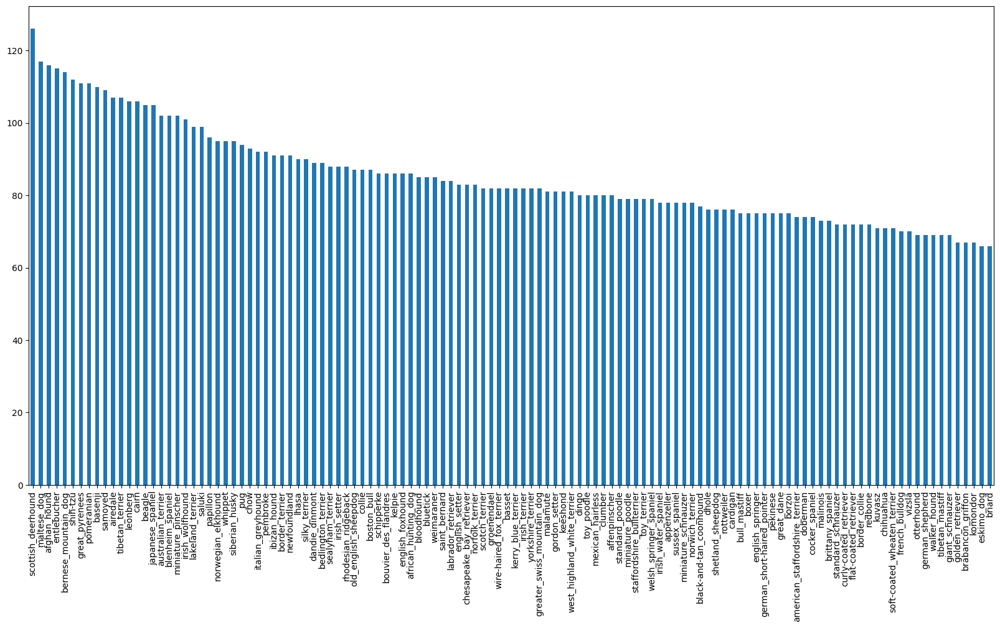

In [9]:
# without importing matplotlib
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [10]:
labels_csv["breed"].value_counts().mean(), labels_csv["breed"].value_counts().median()

(85.18333333333334, 82.0)

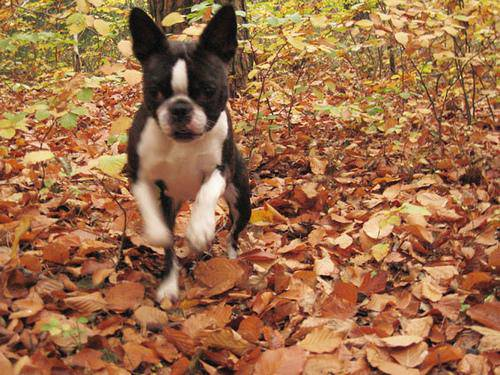

In [11]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

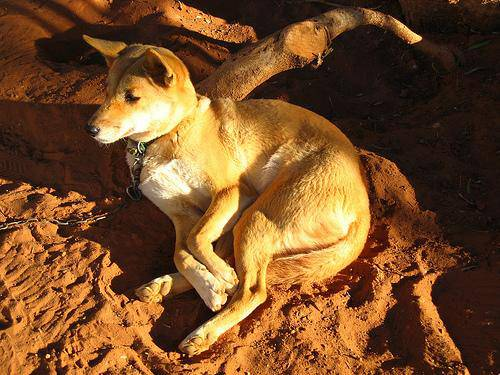

In [12]:
# Let's view another image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels

Trying to get a list of our image file pathnames

In [13]:
# Create pathnames from image ID's
filenames = [fname for fname in labels_csv["id"]]

# checking the first 10
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [14]:
filenames = ["/content/drive/My Drive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# checking the first 10
filenames[:10]

['/content/drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [15]:
# Check whether no of file names matches the actual number of data
import os
if len(os.listdir("/content/drive/My Drive/Dog Vision/train/")) == len(filenames):
  print("Filenames matches the actual amount of files!!!\nYou can proceed...")
else:
  print("Filenames do not match the actual amount of files, check the target directory.")

Filenames matches the actual amount of files!!!
You can proceed...


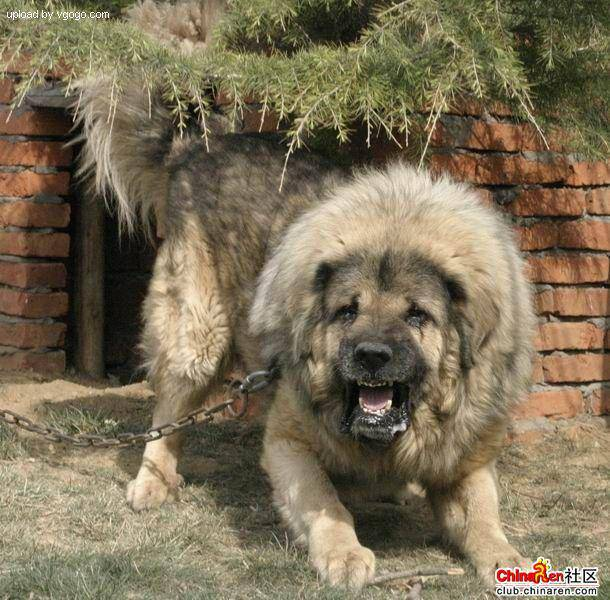

In [16]:
# One more image
Image(filenames[9000])

In [17]:
# Just checking the breed of 9000th dog
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've got our training image filepaths in a list, let's prepare our labels.

In [18]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels

# the 2nd line could be done this way as well
# labels = labels_csv["breed"]
# labels = np.array(labels)

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
len(labels)

10222

In [20]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames.")
else:
  print("Number of labels does not matches the number of filenames.\nCheck the directories...")

Number of labels matches the number of filenames.


## Convert the object type labels into integers

Now we have to convert the object type labels into integers.

Object types won't be able to fit in the model.

In [21]:
# Find the number of unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [22]:
len(unique_breeds)

120

In [23]:
# Turning a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [24]:
# Turning every label into a boolean array
boolean_labels = [i == unique_breeds for i in labels]
boolean_labels[:2] # just watching the 1st two

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [25]:
len(boolean_labels)

10222

In [26]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [27]:
# turning another one like this
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating our validation set

Since the dataset from Kaggle doesn't come with a validation set, we have to create our own.

In [28]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [29]:
len(filenames)

10222

* Since there is a lot of data (length = 10222). It's going to take a lot of time to train the model.

* That is why, we'll start the training of data from the first thousand images and then increase as per our need.

In [30]:
# Set the number of images to use for experimenting
# Below bar happens only in colab (It's like a magic function)

NUM_IMAGES = 1000 # @param {type:"slider", min:1000, max:10000, step:1000}

In [31]:
# Splitting our data into train and validation sets
from sklearn.model_selection import train_test_split

# splitting them into train & validation sets of total size - NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [32]:
# Having a peek at the training data
X_train[:2], y_train[:2]

(['/content/drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fals

## Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors, we're going to write a function which does the following:

1. Take an image filepath as input
2. Use TensorFlow to read the file & save it to a variable (called "image")
3. Turn our variable (image) (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the varaible image to be a shape of (224, 224)
6. Return the modified "image"


TensorFlow loading data guidelines: https://www.tensorflow.org/guide/data

In [33]:
# Converting the image into a Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape
# o/p -> width, height & color channel (Red, Green, Blue)

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
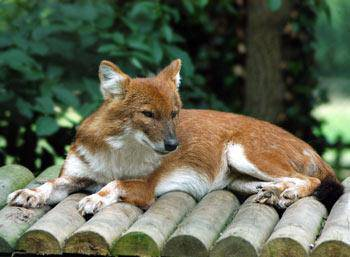

In [34]:
image
# in order to look at the data (click on the the show data button)

In [35]:
image.max(), image.min()

(255, 0)

In [36]:
# Converting numpy array of image into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Since, we've seen what an image looks like as a Tensor, let's make a function to preprocess them. (It will perform all the 5 points mentioned earlier.)


1. Take an image filepath as input
2. Use TensorFlow to read the file & save it to a variable (called "image")
3. Turn our variable (image) (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the varaible image to be a shape of (224, 224)
6. Return the modified "image"

In [37]:
# Define image size
IMG_SIZE = 224

# Creating the function for preprocessing image into Tensor.
def process_image(image_path):
  """
  Takes an image file path & turns the image into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

In [38]:
# checking the above functions -> tf.io.read_file line
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [39]:
# checking the above functions -> tf.image.decode_jpeg line
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [40]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

- Checked the line by line steps which we were taking in our process_image function.

## Turning our data into batches

Why turn our data into batches?
- Because if we will try to process 10000+ images in one go, they all might not fit into the memory.
- So that is why we take about 32 (batch size) images at a time (can also adjust the batch size on our own)


Inorder to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`

In [41]:
 # Create a simple function to return a tuple (image, label)

def get_image_label(image_path, label):
  """
  Takes an image file path name & the associated label,
  processes the image & returns a tuple of (image, label).
  """

  image = process_image(image_path)
  return image, label

In [42]:
# demo of the above function
(process_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [43]:
# in a tuple of constant and label pair
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Since we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all our data (X & y) into batches.

In [44]:
# Define the batch size (32)
BATCH_SIZE = 32 #32 is default but doing it manually anyway

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) & label (y) pairs.
  Shuffles the data if it is the training set. But, it wont shuffle if it is the validation set.
  Also, accepts the test data as input (no labels).
  """

  # if the data is test dataset, we probably don't have any labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we wont shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # if the data is training set, we'll shuffle it
  else:
    print("Creating training set batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames & labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [45]:
# Create training & validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training set batches...
Creating validation data batches...


In [46]:
# Checking the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visulaizing Data Batches

Our data is now in batches.

In order to understand them effectively, let's visualize them.

In [47]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images & their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows & 5 columns)
    ax = plt.subplot(5, 5, i+1)

    # Display an image
    plt.imshow(images[i])

    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()]) # next cell shows what the title will be

    # Turn the grid lines off
    plt.axis("off")

In [48]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [49]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [50]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.69803923, 0.8078432 , 0.86274517],
          [0.69803923, 0.8078432 , 0.86274517],
          [0.69803923, 0.8078432 , 0.86274517],
          ...,
          [0.8863342 , 0.5757777 , 0.50835854],
          [0.7951043 , 0.6108087 , 0.5642088 ],
          [0.65276986, 0.6393074 , 0.6253041 ]],
 
         [[0.69803923, 0.8078432 , 0.86274517],
          [0.69803923, 0.8078432 , 0.86274517],
          [0.69803923, 0.8078432 , 0.86274517],
          ...,
          [0.93375236, 0.61523837, 0.5389947 ],
          [0.769212  , 0.5672812 , 0.50924337],
          [0.5617812 , 0.5164014 , 0.4847893 ]],
 
         [[0.69803923, 0.8078432 , 0.86274517],
          [0.69803923, 0.8078432 , 0.86274517],
          [0.69803923, 0.8078432 , 0.86274517],
          ...,
          [0.97650546, 0.655612  , 0.5697402 ],
          [0.81551045, 0.5819486 , 0.49941185],
          [0.52381814, 0.42865178, 0.3647076 ]],
 
         ...,
 
         [[0.31265897, 0.40677664, 0.17932563],
          [0.40755

In [51]:
len(train_images), len(train_labels)

(32, 32)

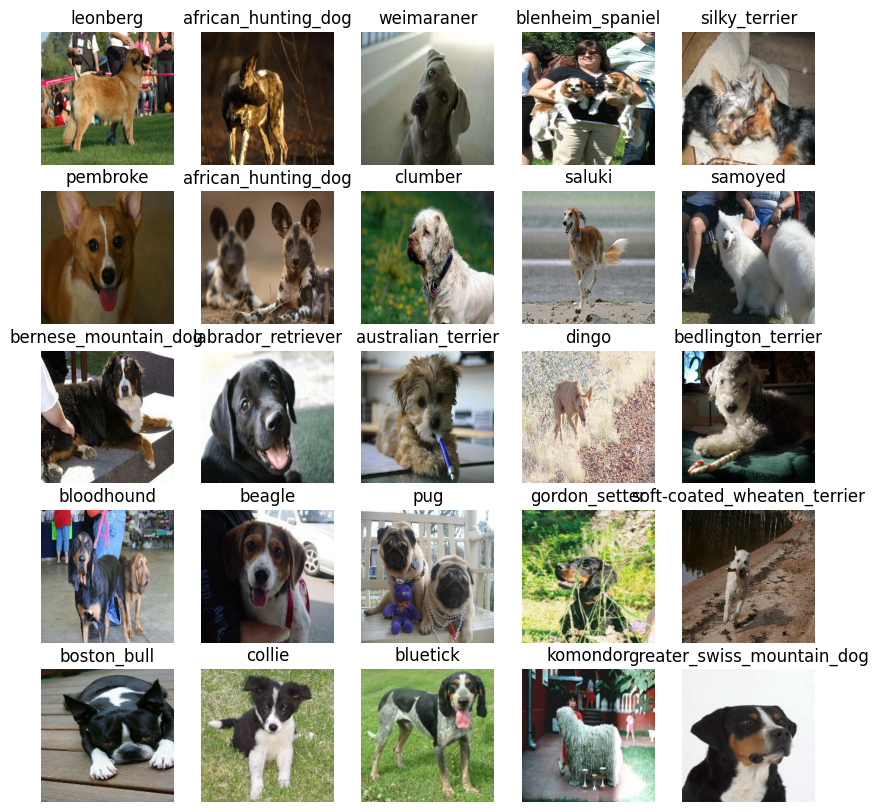

In [52]:
# Visualizing the data in atraing batch
show_25_images(train_images, train_labels)

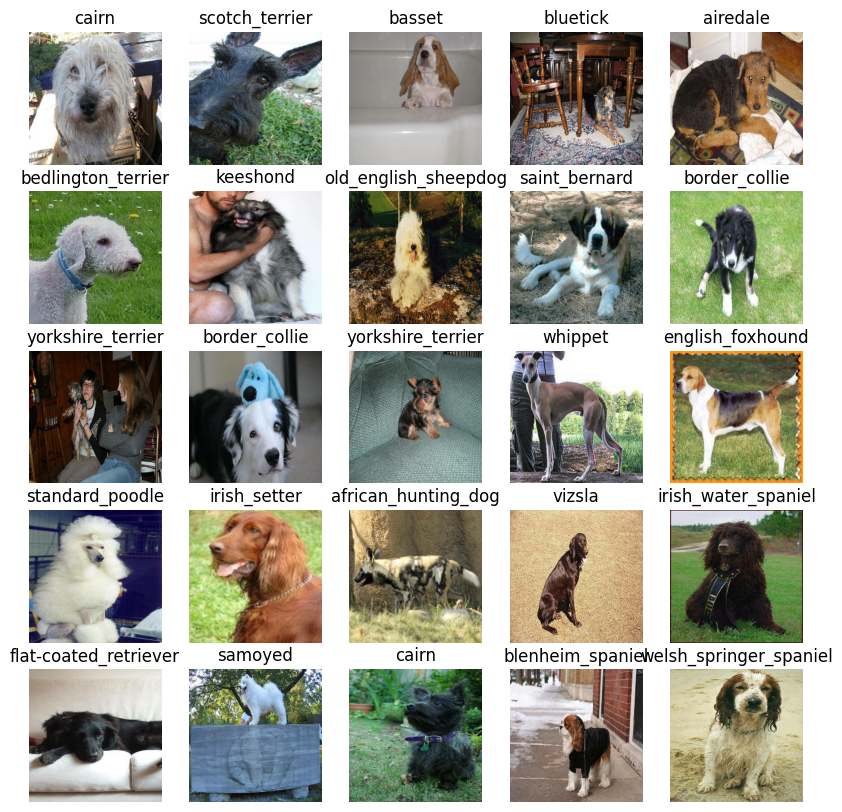

In [53]:
# Now visualizing our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) of our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

Find the models here: https://www.kaggle.com/models?tfhub-redirect=true

In [54]:
IMG_SIZE

224

In [55]:
# Setup the input shape of our model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

As we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

**Note to remember:**

For activation in "tf.keras.layers.Dense" we use...

1. For binary classification - activation="sigmoid"
  - For 'loss' = BinaryCrossentropy
2. For multi-class classification - activation="softmax" (this problem)
  - For 'loss' = CategoricalCrossentropy

In [56]:
# Create a function which builds a Keras Model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print ("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([hub.KerasLayer(MODEL_URL), # Layer 1 -> Input Layer
                               tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                     activation="softmax") # Layer 2 -> Output Layer
                               ])

  # Compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  # Build The model
  model.build(INPUT_SHAPE)

  return model

In [57]:
model = create_model()
model.summary()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks are helper function a model can use during training to do things such as 'saving its progress', 'check its progress', or 'stop training early if a model stops improving'.


We'll create two callbacks, one for TensorBoard which helps track our models progress & another for early stopping which prevents our model fromtraing for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to directory and pass it to our model's `fit()` function.
3. Visualize our models traing logs with the `%tensorboard` magic function (we'll do this after model training).

In [58]:
# Loading TensorBoard notebook extension
%load_ext tensorboard

In [59]:
import datetime

# Create a function to build a TensorBoard callback
# Figures out if its learning correctly or is it doing well or not?
def create_tensorboard_callback():

  # Create a logs directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog Vision/logs",
                        # Making it in such a way that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [60]:
# Creating an early stoping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)

Our 1st model is only going to train on 1000 images, to make sure everything is working.

In [61]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [62]:
# Checking to make sure that we're still running on GPU
print("GPU", "is available..." if tf.config.list_physical_devices("GPU") else "is not available...")

GPU is not available...


## Creating a function that trains a model.

* Create a model using `create_model()`
* Setup our TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return  the model

In [63]:
# Build a function to train & return a trained model
def train_model():
  """
  Trains a given model & returns the trained version
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data by passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [64]:
# Fit the model to the data
model = train_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 309s 12s/step - loss: 4.6183 - accuracy: 0.0938 - val_loss: 3.5060 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 79s 3s/step - loss: 1.6508 - accuracy: 0.6850 - val_loss: 2.2456 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 104s 4s/step - loss: 0.5684 - accuracy: 0.9388 - val_loss: 1.7955 - val_accuracy: 0.5400
Epoch 4/100
25/25 [==============================] - 81s 3s/step - loss: 0.2468 - accuracy: 0.9900 - val_loss: 1.6138 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 87s 4s/step - loss: 0.1457 - accuracy: 0.9987 - val_loss: 1.5444 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 68s 3s/step - loss: 0.1002 - accuracy: 1.0000 - val_loss: 1.4886 - val_accuracy: 0.6200
Epoch 7/100
25/

**NOTE:** It seems like our model is overfitting, because it is performing far better on the training dataset than the validation dataset.

**NOTE:** Overfitting to begin with is a good thing. It nmeans the model is learning.

### Checking the Tensorboard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier & visualize its contents.

In [65]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs
# \(backslash) to escape the space

<IPython.core.display.Javascript object>

## Making & Evaluating predictions using a trained model

In [66]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [67]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 70s 2s/step


array([[6.19039463e-04, 4.79334994e-05, 1.76122133e-03, ...,
        3.71524831e-04, 1.81389332e-05, 1.05119753e-03],
       [1.65711413e-03, 8.94086334e-05, 5.54932747e-03, ...,
        3.29009461e-04, 7.04070367e-03, 3.98486445e-04],
       [2.04938860e-05, 4.93201587e-05, 5.80361166e-06, ...,
        2.66952629e-05, 1.09345085e-04, 1.74581388e-03],
       ...,
       [3.49379957e-06, 3.63262188e-05, 1.99694769e-04, ...,
        1.16187701e-04, 3.75186559e-04, 1.50020242e-05],
       [2.26642261e-03, 7.85186057e-05, 5.64490329e-04, ...,
        3.20164108e-04, 1.53011613e-04, 1.26554752e-02],
       [3.52822687e-03, 3.58215824e-04, 6.15913421e-04, ...,
        3.59841879e-03, 1.85074820e-03, 7.34854530e-06]], dtype=float32)

In [68]:
predictions.shape

(200, 120)

In [69]:
len(y_val), len(unique_breeds)

(200, 120)

In [70]:
predictions[0]

array([6.19039463e-04, 4.79334994e-05, 1.76122133e-03, 1.65223188e-04,
       3.20802035e-04, 1.92125790e-05, 1.53926732e-02, 2.00308918e-04,
       2.47269112e-04, 5.38777444e-04, 7.21732649e-05, 3.08117102e-04,
       3.91192181e-04, 1.14356095e-04, 1.05368160e-03, 1.99079892e-04,
       1.18660937e-05, 1.89741209e-01, 2.09670925e-05, 3.56105556e-05,
       5.05679345e-04, 5.72084282e-05, 2.29717389e-05, 1.01105112e-03,
       8.29982237e-05, 3.06509755e-04, 1.03653885e-01, 5.81439199e-05,
       1.92254651e-04, 1.41217854e-04, 7.39355601e-05, 5.37711603e-04,
       4.66341968e-04, 1.51446511e-05, 2.64631144e-05, 3.29097025e-02,
       1.02817521e-05, 3.17308382e-04, 5.42175476e-05, 5.33421735e-05,
       9.71170608e-04, 3.95441384e-05, 1.09374967e-04, 4.97052970e-05,
       7.28645364e-06, 6.45048349e-05, 2.95014725e-05, 4.19129152e-04,
       8.59661450e-05, 3.56779965e-05, 3.02948174e-04, 1.45350714e-04,
       6.82117243e-04, 9.55105133e-05, 3.80311867e-05, 3.95804745e-05,
      

In [71]:
np.sum(predictions[0])

0.9999999

In [72]:
len(predictions[0])

120

In [73]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[6.19039463e-04 4.79334994e-05 1.76122133e-03 1.65223188e-04
 3.20802035e-04 1.92125790e-05 1.53926732e-02 2.00308918e-04
 2.47269112e-04 5.38777444e-04 7.21732649e-05 3.08117102e-04
 3.91192181e-04 1.14356095e-04 1.05368160e-03 1.99079892e-04
 1.18660937e-05 1.89741209e-01 2.09670925e-05 3.56105556e-05
 5.05679345e-04 5.72084282e-05 2.29717389e-05 1.01105112e-03
 8.29982237e-05 3.06509755e-04 1.03653885e-01 5.81439199e-05
 1.92254651e-04 1.41217854e-04 7.39355601e-05 5.37711603e-04
 4.66341968e-04 1.51446511e-05 2.64631144e-05 3.29097025e-02
 1.02817521e-05 3.17308382e-04 5.42175476e-05 5.33421735e-05
 9.71170608e-04 3.95441384e-05 1.09374967e-04 4.97052970e-05
 7.28645364e-06 6.45048349e-05 2.95014725e-05 4.19129152e-04
 8.59661450e-05 3.56779965e-05 3.02948174e-04 1.45350714e-04
 6.82117243e-04 9.55105133e-05 3.80311867e-05 3.95804745e-05
 6.83225662e-05 1.05275656e-03 8.53049569e-05 2.30791196e-01
 9.86069208e-04 9.01957683e-05 1.20440067e-03 1.52354060e-05
 4.34904476e-04 2.459427

In [74]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[9.93356298e-05 2.66592888e-05 6.37687162e-06 4.26274310e-05
 4.74869506e-03 2.96241138e-04 1.18610369e-04 7.85582874e-04
 8.73203762e-03 5.39327562e-02 1.02253844e-05 2.19955600e-05
 2.74859980e-04 3.78585607e-03 1.45045540e-03 5.63064078e-03
 4.34564099e-05 5.43069968e-04 3.35228833e-04 1.37054813e-04
 1.75664027e-05 1.73851178e-04 6.23967280e-05 3.95406323e-06
 8.22239090e-03 2.89306743e-04 5.75584199e-05 2.40070833e-04
 3.19704064e-04 6.85054110e-05 5.92594188e-05 2.66171555e-04
 1.36143703e-04 8.30498102e-05 2.64088856e-04 4.32532761e-05
 1.43163401e-04 1.07372616e-04 1.43037047e-04 3.38696241e-01
 3.60805454e-04 6.37370686e-05 4.48383437e-03 2.17936085e-05
 2.44787458e-04 3.48195426e-05 1.75359310e-04 1.11147936e-03
 4.23869969e-05 5.69834374e-04 4.13029629e-05 3.18309176e-04
 1.38885443e-04 8.33396427e-03 1.67967897e-04 3.27809976e-04
 2.11841747e-04 8.93473116e-05 3.27760092e-04 2.92461809e-05
 8.62732704e-05 7.10694352e-04 8.65032507e-06 3.63708095e-05
 5.96196551e-05 1.938665

Having the above functionality is great but we want to be able to do it on scale.

And it would be great if we could see the image, the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [75]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'irish_wolfhound'

In [76]:
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [77]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify (reverse the batching process) it to make predictions on the validation images & then compare those predictions to the validation labels (truth labels)

In [78]:
images_ = []
labels_ = []

# loop through the unbatch data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [79]:
get_pred_label(labels_[0]), get_pred_label(predictions[0])

('cairn', 'irish_wolfhound')

In [89]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batch dataset of (image, label) Tensors & returns seperate arrays of images & labels.
  """

  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [81]:
get_pred_label(val_labels[0])

'cairn'

Now that we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images


Let's make a function to make these all a bit more visualized.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images & an integer.
* Convert the prediction probabilities to a predicted labels.
* Plot the predicted label, its predicted probability, the truth label & the target image on a single plot.


In [82]:
# def plot_pred(prediction_probabilities, labels, images, n=1):
#   """
#   View the prediction, ground truth & image for a sample n
#   """

#   pred_prob, true_label, image=prediction_probabilities[n], labels[n], images[n]

#   # Get the pred label
#   pred_label = get_pred_label(pred_prob)

#   # Plot image & remove ticks
#   plt.imshow(image)
#   plt.xticks([])
#   plt.yticks([])

#   # Change plot title to be predicted, probability of prediction & truth label
#   plt.title("{} {:2.0f}% {}".format(pred_label,
#                                     np.max(pred_prob)*100,
#                                     true_label))

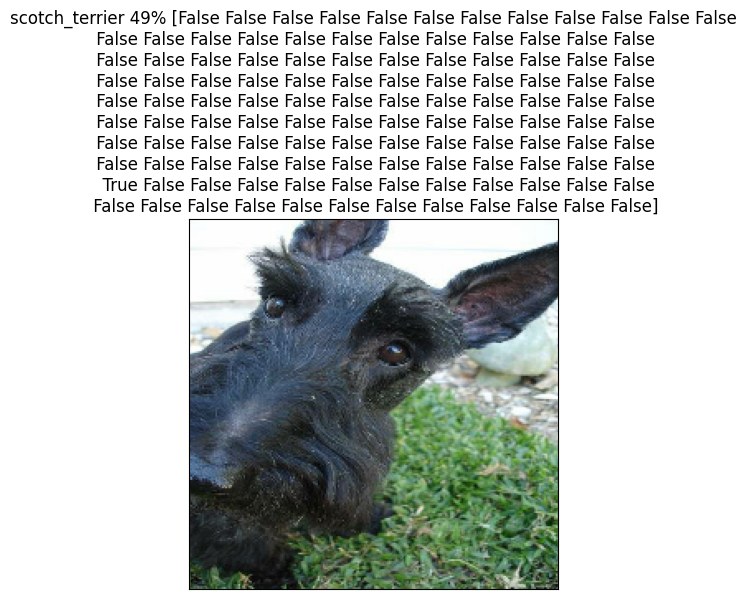

In [83]:
# plot_pred(prediction_probabilities=predictions,
#           labels=val_labels,
#           images=val_images)

In [94]:
# Making the above function a bit better


def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth & image for a sample n
  """

  pred_prob, true_label, image=prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction & truth label
  plt.title("Predicted: {} {:2.0f}%\nActual: {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

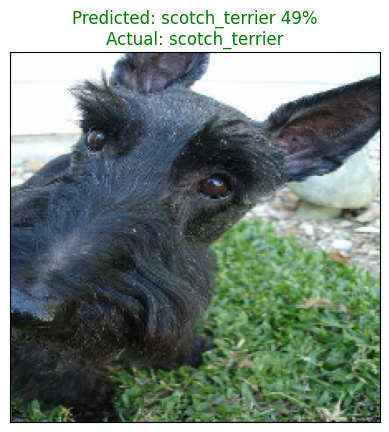

In [95]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

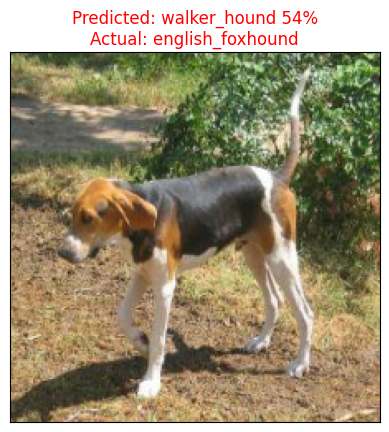

In [96]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

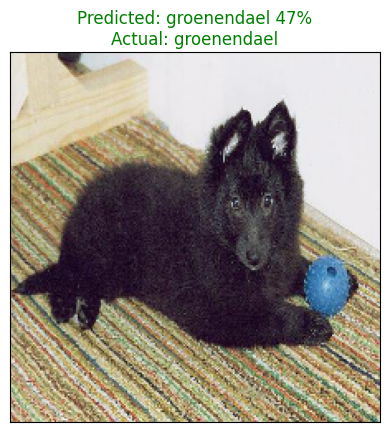

In [97]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Since we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

The function will:
* Take an input of prediction probabilities array and a ground truth array & an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indices
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values & labels, and coloring the true label green.

In [112]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Gives the top 10 highest prediction confidences along with the truth label for sample n
  """

  pred_prob, true_label=prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indices
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indices]

  # Find the top prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  # Setup plot
  top_10_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_10_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

The next few cells will demonstrate what we are doing in above function's "find top 10 prediction confidence indices" section, step wise...

In [86]:
predictions[0]

array([6.19039463e-04, 4.79334994e-05, 1.76122133e-03, 1.65223188e-04,
       3.20802035e-04, 1.92125790e-05, 1.53926732e-02, 2.00308918e-04,
       2.47269112e-04, 5.38777444e-04, 7.21732649e-05, 3.08117102e-04,
       3.91192181e-04, 1.14356095e-04, 1.05368160e-03, 1.99079892e-04,
       1.18660937e-05, 1.89741209e-01, 2.09670925e-05, 3.56105556e-05,
       5.05679345e-04, 5.72084282e-05, 2.29717389e-05, 1.01105112e-03,
       8.29982237e-05, 3.06509755e-04, 1.03653885e-01, 5.81439199e-05,
       1.92254651e-04, 1.41217854e-04, 7.39355601e-05, 5.37711603e-04,
       4.66341968e-04, 1.51446511e-05, 2.64631144e-05, 3.29097025e-02,
       1.02817521e-05, 3.17308382e-04, 5.42175476e-05, 5.33421735e-05,
       9.71170608e-04, 3.95441384e-05, 1.09374967e-04, 4.97052970e-05,
       7.28645364e-06, 6.45048349e-05, 2.95014725e-05, 4.19129152e-04,
       8.59661450e-05, 3.56779965e-05, 3.02948174e-04, 1.45350714e-04,
       6.82117243e-04, 9.55105133e-05, 3.80311867e-05, 3.95804745e-05,
      

In [100]:
predictions[0].argsort()

array([ 44,  36,  16, 101,  33,  63, 115, 118,   5,  18,  22, 113,  34,
       108,  46,  92,  99,  94,  19,  49,  54, 112,  41,  55, 107,  84,
         1,  86,  43,  39,  38,  21,  27,  69,  45,  56,  10,  30,  88,
        24,  58,  48,  61,  53,  66,  85,  42,  13,  91,  29,  89,  51,
        67,  71,   3,  72,  28,  15,   7,  95,  75,   8, 110,  82,  74,
        50,  25,  11,  37,   4, 105, 114, 117,  12,  47,  64,  32, 111,
        20,  31,   9,  90,  87,   0,  96,  52, 104,  40,  60,  23,  80,
       119,  57,  14,  62,  98,  78,  77,   2,  93,  97,  81, 116,  83,
        76,  68,  79,  73,   6, 100,  65, 109,  35,  70, 106, 102,  26,
       103,  17,  59])

In [101]:
predictions[0].argsort()[-10:]
# These are the top 10 indices

array([ 65, 109,  35,  70, 106, 102,  26, 103,  17,  59])

In [105]:
# Reversing the top 10 indices as we want it in descending order
predictions[0].argsort()[-10:][::-1]
# And we are going to use this in our function...

array([ 59,  17, 103,  26, 102, 106,  70,  35, 109,  65])

In [103]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.2307912 , 0.18974121, 0.13223132, 0.10365389, 0.05907926,
       0.04563291, 0.0344207 , 0.0329097 , 0.03079133, 0.02459428],
      dtype=float32)

In [104]:
predictions[0].max()

0.2307912

In [107]:
unique_breeds[predictions[0].argsort()[-10:][::-1]]

array(['irish_wolfhound', 'border_terrier', 'soft-coated_wheaten_terrier',
       'cairn', 'silky_terrier', 'standard_schnauzer', 'lhasa',
       'dandie_dinmont', 'tibetan_terrier', 'komondor'], dtype=object)

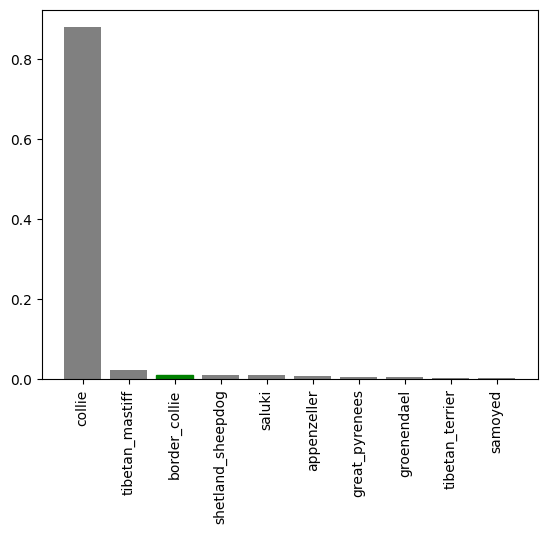

In [113]:
# Checking the above function we created...

plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

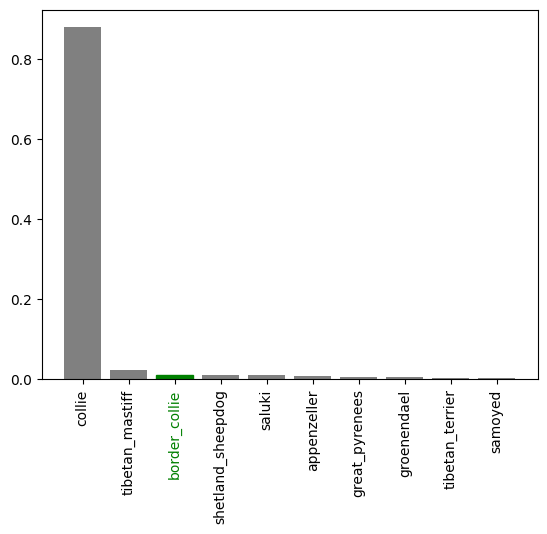

In [122]:
# Extra...

def plot_pred_conf2(prediction_probabilities, labels, n=1):
  """
  Gives the top 10 highest prediction confidences along with the truth label for sample n
  """

  pred_prob, true_label=prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indices
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indices]

  # Find the top prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  # Setup plot
  top_10_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_10_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

  # Change the color of true xtick to green
  for i, label in enumerate(top_10_pred_labels):
    if label == true_label:
      plt.gca().get_xticklabels()[i].set_color("green")

plot_pred_conf2(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now that we've got some function to help us visualize our predictions & evaluate our model.

Let's check out a few predictions and their different values.

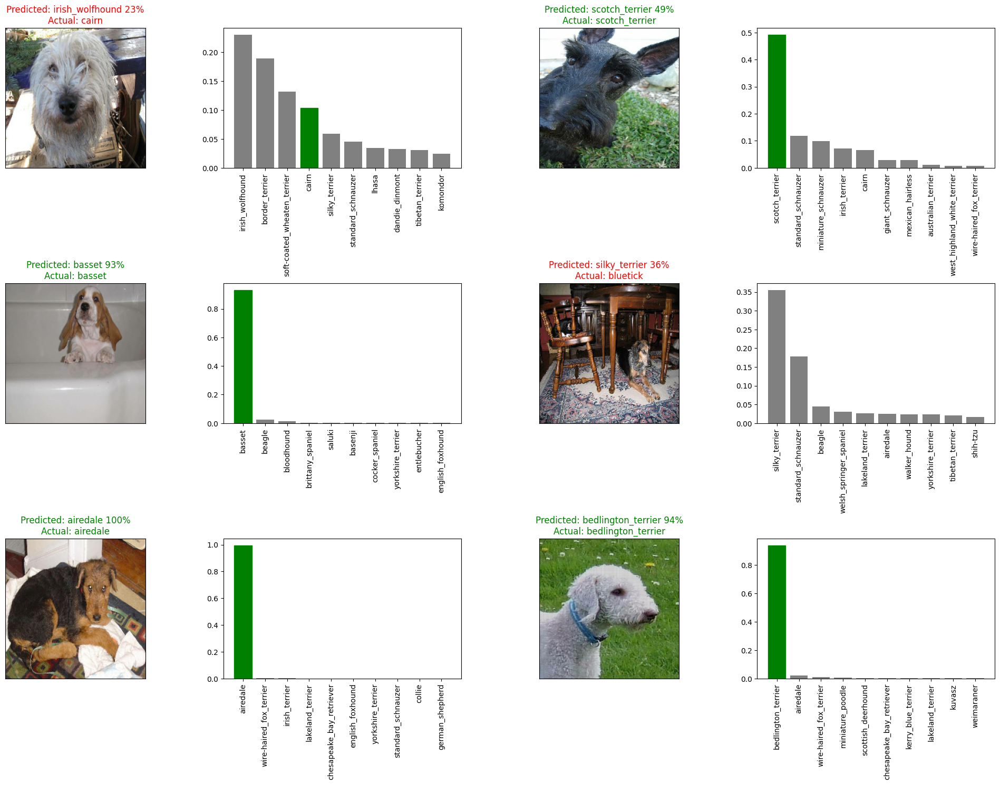

In [129]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0) # to make it look better
plt.show()

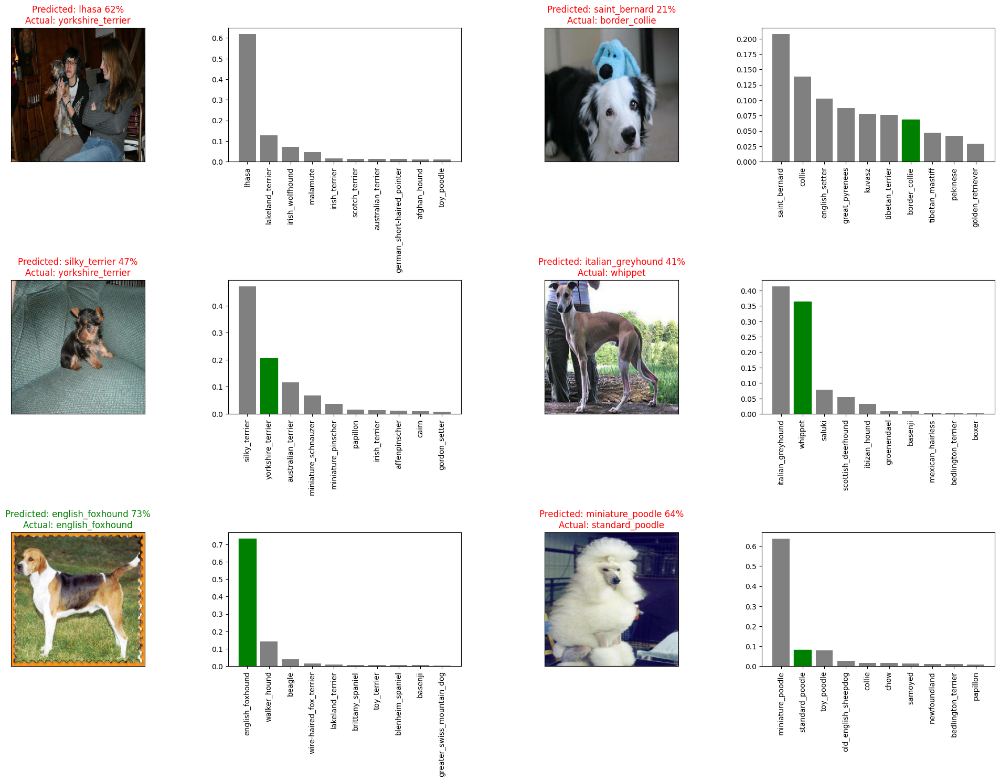

In [130]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0) # to make it look better
plt.show()

## Saving & reloading a trained model

In [2]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a "saved_models" directory & appends a suffix (string).
  """

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog Vision/saved_models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))

  model_path = modeldir + "-" + suffix + ".h5" # save format of a model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [3]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_keras={"KerasLayer":hub.KerasLayer})

  return model

Now that we've got functions to save & load a trained model, let's make sure they work!

In [4]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

NameError: name 'model' is not defined

# Flag 1

In [5]:
# Load a trained model

# loaded_1000_image_model = load_model("<model name in here>")

In [6]:
# Evaluate the pre-saved model
model.evaluate(val_data)

NameError: name 'model' is not defined

In [7]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

NameError: name 'loaded_1000_image_model' is not defined

## Training the model (on the full data)

In [8]:
len(X), len(y)

NameError: name 'X' is not defined

In [ ]:
X[:10], y[:2]

In [ ]:
len(X_train)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)
full_data

In [ ]:
# Create a model for full dataset
full_model = create_model()

In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all of the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**NOTE:** Running the cell below will take a little while (maybe upto 60 mins for the 1st epoch) becuase the GPU we're using in the runtime has to load all the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

# Flag 2

In [ ]:
# Load in the full model

# loaded_full_model = load_model("<model name in here>")

## Making predictions on the test dataset

Since our model was trained on images in the form of Tensor batches to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `created_data_batches()` earlier which takes a list of filenames as input & cover them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` & setting the `test_data` parameter to `True` (since the test data doesn't have labels)
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [9]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog Vision/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

NameError: name 'os' is not defined

In [ ]:
len(test_filenames)

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

In [ ]:
test_data

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

The above cell will take almost 120 mins to run...

In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

The code below is to save another predictions done by Dan earlier into the drive use it...

# Flag 3

In [10]:
# Load predictions (Numpy array) from csv file

# the below file might be different so make sure to check it
# test_predictions = np.loadtxt("/content/drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")
# test_predictions[:10]

In [ ]:
test_predictions.shape

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [2]:
list(unique_breeds)

NameError: name 'unique_breeds' is not defined

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

In [ ]:
test_filenames

In [3]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

NameError: name 'test' is not defined

In [ ]:
preds_df.head()

In [4]:
# Add the prediction probabilites to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

NameError: name 'test_predictions' is not defined

In [ ]:
# Save our predictions DataFrame to csv for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_1+mobilenetv2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.


# Flag 4

In [ ]:
# Get custom image filepaths
# custom_path = "/content/drive/MyDrive/Dog Vision/<folder name>"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

In [ ]:
# Turns cusom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels...
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
# Check custom predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)